In [1]:
# ✅ Install dependencies
!pip install -q diffusers transformers accelerate peft matplotlib pandas

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 90.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 70.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 43.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 111.6 MB/s eta 0:00:00


In [3]:
!pip install peft==0.5.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.6/85.6 kB 4.3 MB/s eta 0:00:00
  Attempting uninstall: peft
    Found existing installation: peft 0.14.0
    Uninstalling peft-0.14.0:
      Successfully uninstalled peft-0.14.0


In [4]:
!pip uninstall peft

Found existing installation: peft 0.5.0
Uninstalling peft-0.5.0:
  Would remove:
    /usr/local/lib/python3.11/dist-packages/peft-0.5.0.dist-info/*
    /usr/local/lib/python3.11/dist-packages/peft/*
Proceed (Y/n)? Y
  Successfully uninstalled peft-0.5.0


In [5]:
!pip install peft==0.5.0

  Using cached peft-0.5.0-py3-none-any.whl.metadata (22 kB)
Using cached peft-0.5.0-py3-none-any.whl (85 kB)


In [6]:
# ✅ Imports
import torch
from diffusers import StableDiffusionPipeline
from peft import PeftModel
from transformers import CLIPModel, CLIPProcessor
from PIL import Image
import matplotlib.pyplot as plt
import pandas as pd
import os

In [7]:
# ✅ Load CLIP model
clip_model = CLIPModel.from_pretrained("openai/clip-vit-large-patch14").to("cuda")
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-large-patch14")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/4.52k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.71G [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/905 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/961k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

In [8]:
def get_clip_score(image, prompt):
    inputs = clip_processor(text=prompt, images=image, return_tensors="pt", padding=True).to("cuda")
    outputs = clip_model(**inputs)
    return outputs.logits_per_image.softmax(dim=1).item()

In [9]:
# ✅ Load base model
def load_base_pipe():
    pipe = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16).to("cuda")
    pipe.safety_checker = lambda images, **kwargs: (images, [False] * len(images))
    return pipe

In [10]:
# ✅ Load LoRA model using PEFT
def load_lora_pipe(lora_path="/content/finetuned-v1"):
    pipe = StableDiffusionPipeline.from_pretrained(
        "runwayml/stable-diffusion-v1-5",
        torch_dtype=torch.float16
    )
    pipe = pipe.to("cuda")
    pipe.safety_checker = lambda images, **kwargs: (images, [False] * len(images))
    if os.path.exists(lora_path):
        pipe.unet = PeftModel.from_pretrained(pipe.unet, lora_path)
        print(f"✅ LoRA adapter loaded from {lora_path}")
    else:
        print(f"⚠️ LoRA path not found: {lora_path}. Using base model.")
    return pipe

In [18]:
# ✅ Prompts
prompts = [
    "Bill Gates in ninja portrait",
    "A boy in a red dress ninja style",
    "A girl with a dog",
    "A woman with a bandage on her head",
    "A man sitting on a bench",
    "A man with white hair and brown eyes",
    "Michael Jackson in a ninja portrait",
    "A man and a woman sitting",
    "An old man with an umbrella",
    "A girl with a flower"
]


In [19]:
# ✅ Load both pipelines
base_pipe = load_base_pipe()
lora_pipe = load_lora_pipe("/content/finetuned-v1")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

✅ LoRA adapter loaded from /content/finetuned-v1


In [20]:
# ✅ Generate and compare CLIPScores
clip_data = []
for prompt in prompts:
    with torch.autocast("cuda"):
        base_img = base_pipe(prompt, num_inference_steps=50).images[0]
        lora_img = lora_pipe(prompt, num_inference_steps=50).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

In [21]:
base_score = get_clip_score(base_img, prompt)
lora_score = get_clip_score(lora_img, prompt)

In [22]:
clip_data.append({
        "Prompt": prompt,
        "Base CLIPScore": base_score,
        "LoRA CLIPScore": lora_score
    })

In [23]:
clip_df = pd.DataFrame(clip_data)

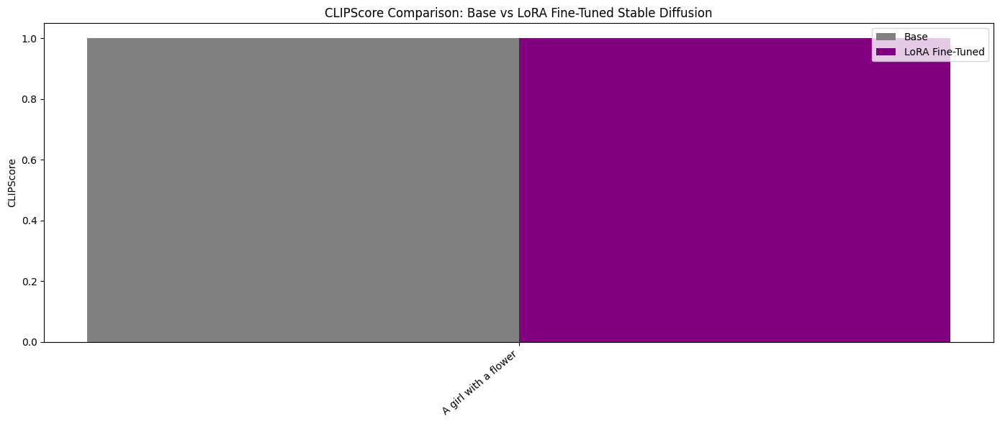

In [24]:
# ✅ Plotting
plt.figure(figsize=(14, 6))
x = range(len(clip_df))
plt.bar([i - 0.2 for i in x], clip_df["Base CLIPScore"], width=0.4, label="Base", color="gray")
plt.bar([i + 0.2 for i in x], clip_df["LoRA CLIPScore"], width=0.4, label="LoRA Fine-Tuned", color="purple")
plt.xticks(ticks=x, labels=clip_df["Prompt"], rotation=40, ha='right')
plt.ylabel("CLIPScore")
plt.title("CLIPScore Comparison: Base vs LoRA Fine-Tuned Stable Diffusion")
plt.legend()
plt.tight_layout()
plt.show()

In [25]:
print(clip_df)


                 Prompt  Base CLIPScore  LoRA CLIPScore
0  A girl with a flower             1.0             1.0


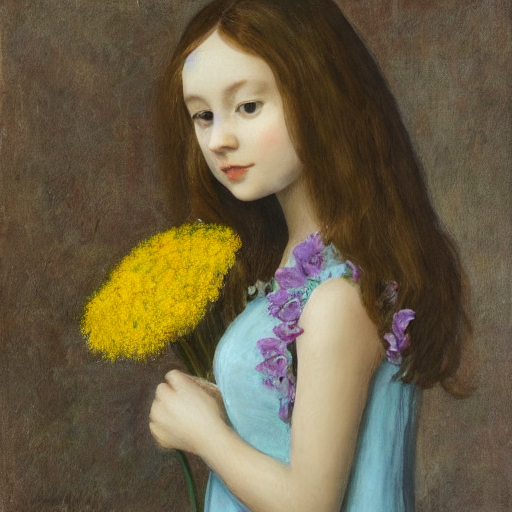

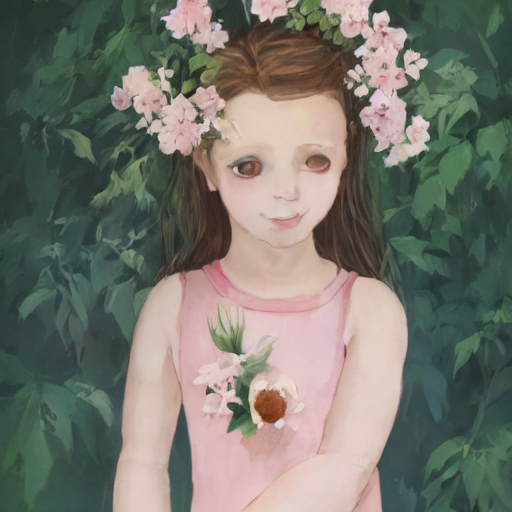

In [26]:
display(base_img)
display(lora_img)


In [27]:
clip_data = []

for prompt in prompts:
    with torch.autocast("cuda"):
        base_img = base_pipe(prompt).images[0]
        lora_img = lora_pipe(prompt).images[0]

    base_score = get_clip_score(base_img, prompt)
    lora_score = get_clip_score(lora_img, prompt)

    clip_data.append({
        "Prompt": prompt,
        "Base CLIPScore": base_score,
        "LoRA CLIPScore": lora_score
    })

clip_df = pd.DataFrame(clip_data)  # ✅ Only build DataFrame AFTER loop


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

In [28]:
print(clip_df)

                                 Prompt  Base CLIPScore  LoRA CLIPScore
0          Bill Gates in ninja portrait             1.0             1.0
1      A boy in a red dress ninja style             1.0             1.0
2                     A girl with a dog             1.0             1.0
3    A woman with a bandage on her head             1.0             1.0
4              A man sitting on a bench             1.0             1.0
5  A man with white hair and brown eyes             1.0             1.0
6   Michael Jackson in a ninja portrait             1.0             1.0
7             A man and a woman sitting             1.0             1.0
8           An old man with an umbrella             1.0             1.0
9                  A girl with a flower             1.0             1.0


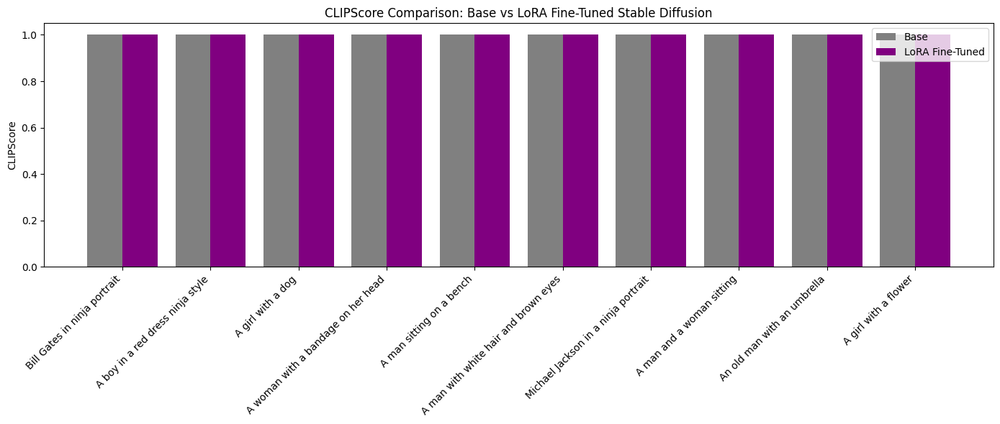

In [29]:
# ✅ Plot CLIPScore Comparison: All Prompts
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 6))
x = range(len(clip_df))
plt.bar([i - 0.2 for i in x], clip_df["Base CLIPScore"], width=0.4, label="Base", color="gray")
plt.bar([i + 0.2 for i in x], clip_df["LoRA CLIPScore"], width=0.4, label="LoRA Fine-Tuned", color="purple")
plt.xticks(ticks=x, labels=clip_df["Prompt"], rotation=45, ha='right')
plt.ylabel("CLIPScore")
plt.title("CLIPScore Comparison: Base vs LoRA Fine-Tuned Stable Diffusion")
plt.legend()
plt.tight_layout()
plt.show()

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Base ModelCLIPScore: 1.0000,LoRA ModelCLIPScore: 1.0000

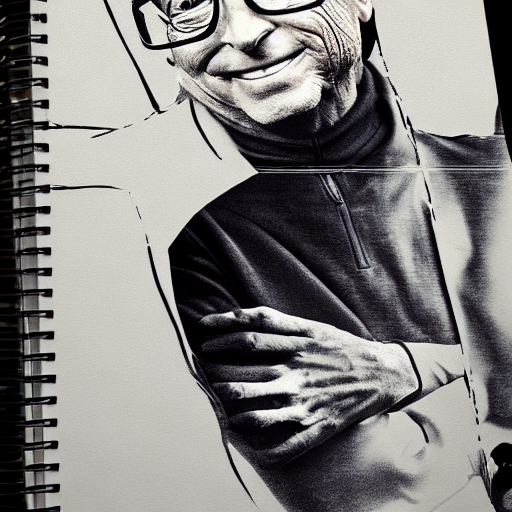
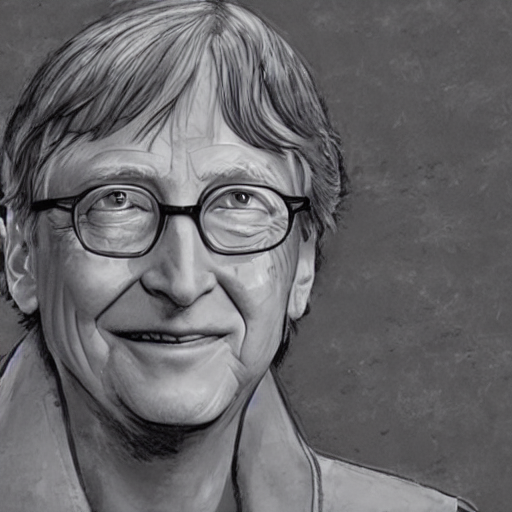

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Base ModelCLIPScore: 1.0000,LoRA ModelCLIPScore: 1.0000

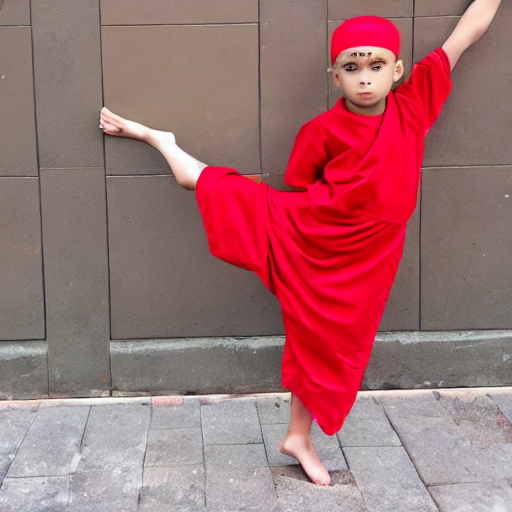
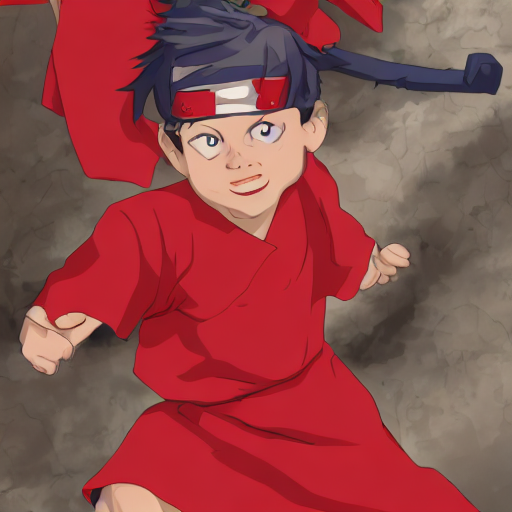

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Base ModelCLIPScore: 1.0000,LoRA ModelCLIPScore: 1.0000

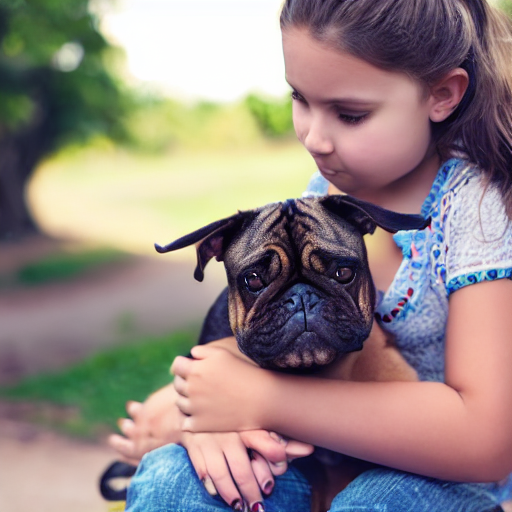
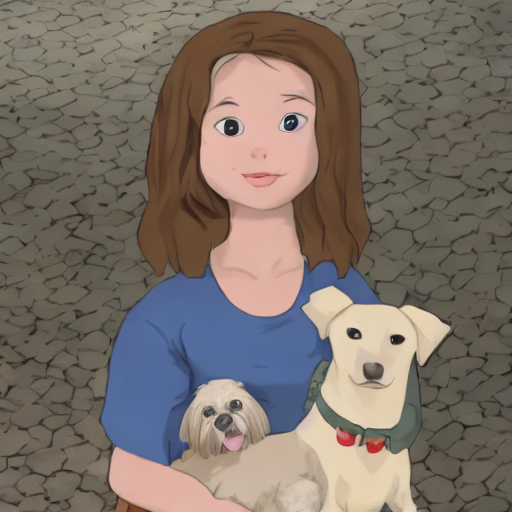

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Base ModelCLIPScore: 1.0000,LoRA ModelCLIPScore: 1.0000

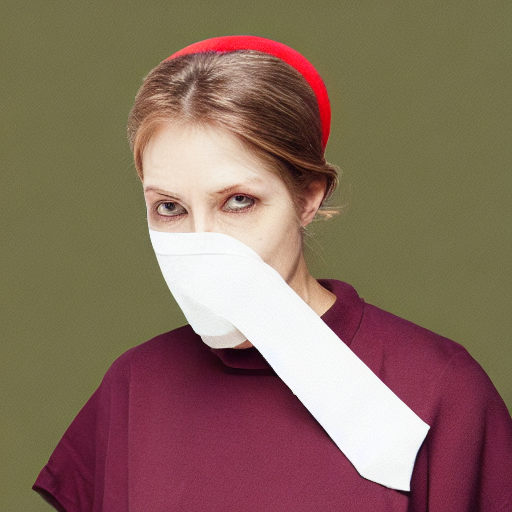
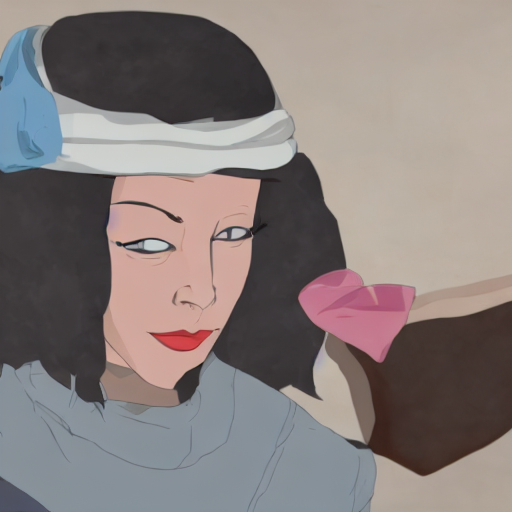

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Base ModelCLIPScore: 1.0000,LoRA ModelCLIPScore: 1.0000

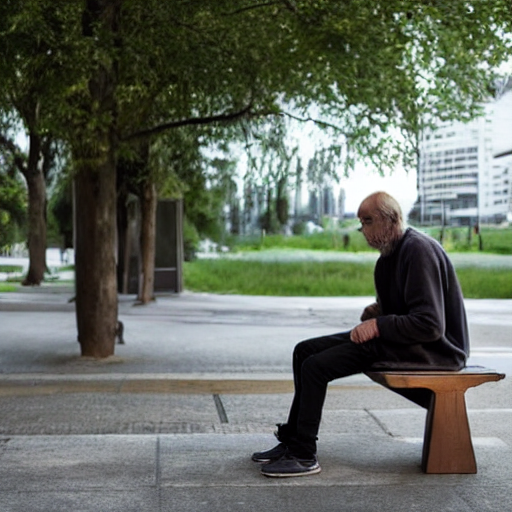
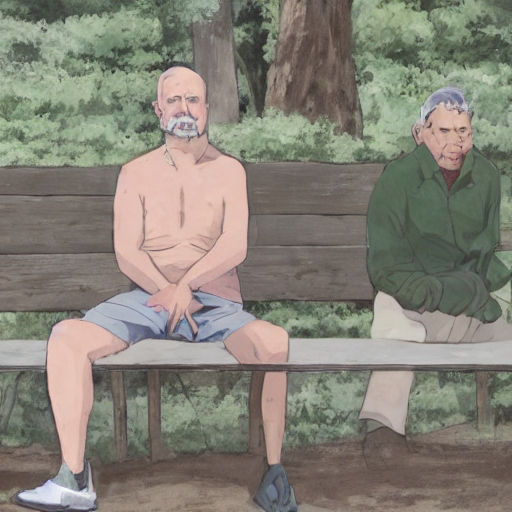

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Base ModelCLIPScore: 1.0000,LoRA ModelCLIPScore: 1.0000

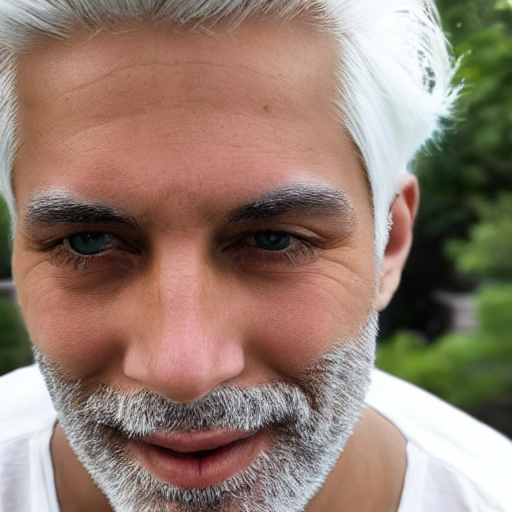
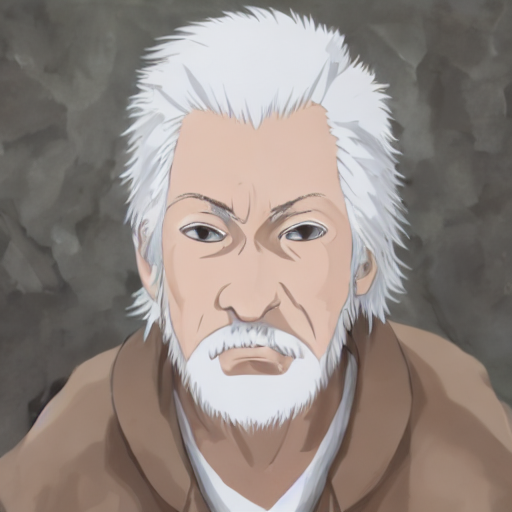

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Base ModelCLIPScore: 1.0000,LoRA ModelCLIPScore: 1.0000

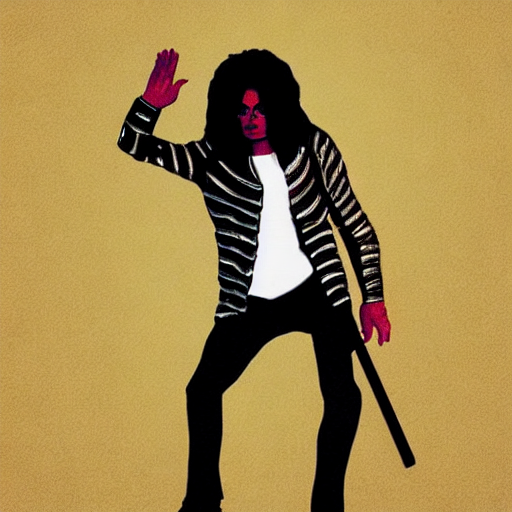
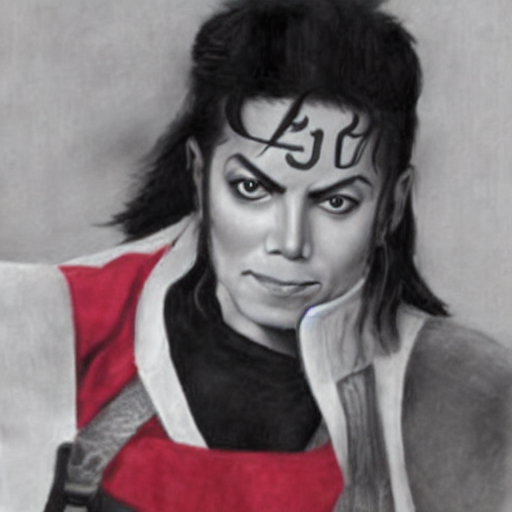

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Base ModelCLIPScore: 1.0000,LoRA ModelCLIPScore: 1.0000

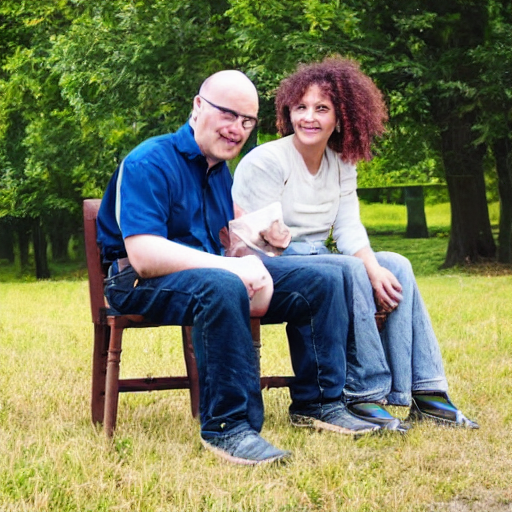
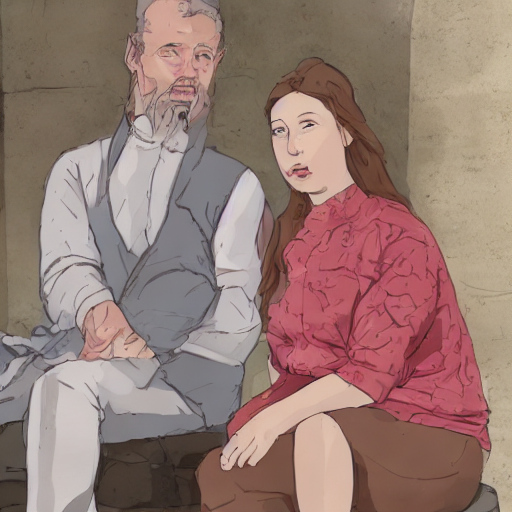

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Base ModelCLIPScore: 1.0000,LoRA ModelCLIPScore: 1.0000

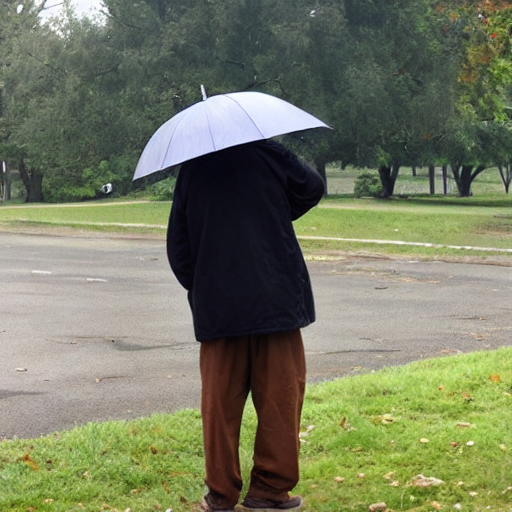
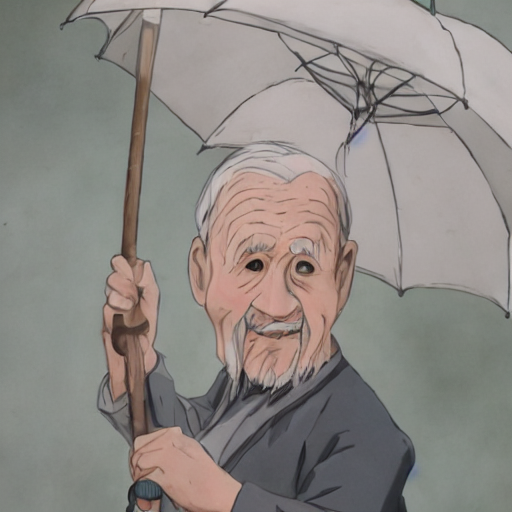

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Base ModelCLIPScore: 1.0000,LoRA ModelCLIPScore: 1.0000

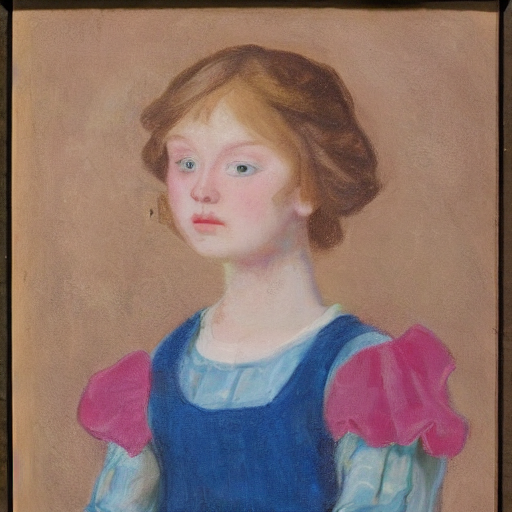
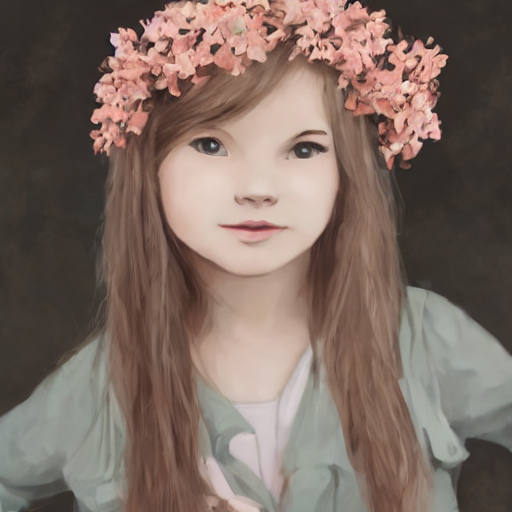

In [32]:
from IPython.display import display, HTML
from PIL import Image
from io import BytesIO
import base64

def image_to_base64(img: Image.Image) -> str:
    buffer = BytesIO()
    img.save(buffer, format="PNG")
    return base64.b64encode(buffer.getvalue()).decode()

# Display each prompt with base and LoRA images + CLIPScores
for i, row in clip_df.iterrows():
    prompt = row["Prompt"]

    with torch.autocast("cuda"):
        base_img = base_pipe(prompt, num_inference_steps=50).images[0]
        lora_img = lora_pipe(prompt, num_inference_steps=50).images[0]

    base64_base = image_to_base64(base_img)
    base64_lora = image_to_base64(lora_img)

    display(HTML(f"<h4>{i+1}. <code>{prompt}</code></h4>"))
    display(HTML(f"""
    <table style="width:100%">
        <tr>
            <td style="text-align:center">
                <b>Base Model</b><br>CLIPScore: {row['Base CLIPScore']:.4f}<br>
                <img src="data:image/png;base64,{base64_base}" width="256">
            </td>
            <td style="text-align:center">
                <b>LoRA Model</b><br>CLIPScore: {row['LoRA CLIPScore']:.4f}<br>
                <img src="data:image/png;base64,{base64_lora}" width="256">
            </td>
        </tr>
    </table>
    """))
